In [1]:
import gym 
import time
import numpy as np
import matplotlib.pyplot as plt

In [40]:
np.random.seed(48304)
env = gym.make('FrozenLake-v1',desc=None,map_name='4x4')
observation = env.reset()[0]
env._max_episode_steps = 1000
env.render()


In [41]:
nS = env.observation_space.n
nA = env.action_space.n

In [ ]:
self = rmaxagent
int( np.ceil(np.log(1 / (self.epsilon * (1-self.gamma))) / (1-self.gamma)))

In [62]:
class RmaxAgent:

    def __init__(self, env, R_max, gamma, max_visits_per_state, max_episodes, max_steps, epsilon = 0.2):
        self.gamma = gamma
        self.epsilon = epsilon
        self.max_steps = max_steps
        self.max_visits_per_state = max_visits_per_state
        self.max_episodes = max_episodes
        self.Q = np.ones((env.observation_space.n, env.action_space.n)) * R_max / (1 - self.gamma)
        # self.Q = np.random.random((env.nS, env.nA))
        self.R = np.zeros((env.observation_space.n, env.action_space.n))  #Slide 33 of this Stanford ppt suggested this change and it worked pretty well 
        #https://web.stanford.edu/class/cs234/slides/2017/lecture10_sample_efficiency.pdf
        self.nSA = np.zeros((env.observation_space.n, env.action_space.n))
        self.nSAS = np.zeros((env.observation_space.n, env.action_space.n, env.observation_space.n))
        self.val1 = []
        self.val2 = []  #This is for keeping track of rewards over time and for plotting purposes  

    def estimate_transition_probablities(self):

        for episode in range(self.max_episodes):

            obs = env.reset()[0]
            if(episode % 20 == 0):
                self.val1.append(self.mean_rewards_per_500())
                self.val2.append(episode)            
            

            for step in range(self.max_steps):

                best_action = self.choose_action(obs)
                new_obs, reward, done, _, _ = env.step(best_action)

                if self.nSA[obs][best_action] < self.max_visits_per_state :

                    self.nSA[obs][best_action] +=1
                    self.R[obs][best_action] += reward
                    self.nSAS[obs][best_action][new_obs] += 1

                    if self.nSA[obs][best_action] == self.max_visits_per_state:

                        for i in range(int( np.ceil(np.log(1 / (self.epsilon * (1-self.gamma))) / (1-self.gamma)) )):

                            for state in range(env.observation_space.n):
                                
                                for action in range(env.action_space.n):

                                    if self.nSA[state][action] >= self.max_visits_per_state:
                                        
                                        #In the cited paper it is given that reward[s,a]= summation of rewards / nSA[s,a]
                                        #We have already calculated the summation of rewards in line 28
                                        q = (self.R[state][action]/self.nSA[state][action])

                                        
                                        for next_state in range(env.observation_space.n):
                                            
                                            #In the cited paper it is given that transition[s,a] = nSAS'[s,a,s']/nSA[s,a]

                                            transition = self.nSAS[state][action][next_state]/self.nSA[state][action]
                                            q += (transition * np.max(self.Q[next_state,:]))

                                        self.Q[state][action] = q 
                                        #print(q + self.gamma*(self.R[state][action]/self.nSA[state][action]))
                                        #In the cited paper it is given that reward[s,a]= summation of rewards / nSA[s,a]
                                        #We have already calculated the summation of rewards in line 28
                
               
                if done:
                    if not(reward==1):
                        self.R[obs][best_action]=-10

                    break

                obs = new_obs
             

    def mean_rewards_per_500(self):
        
        total_reward = 0
        for episodes in range(500):
            observation = env.reset()[0]
            for _ in range(1000):

                action = self.choose_action(observation)
                observation, reward, done, info, _ = env.step(action)
                total_reward += reward
                if done:
                    observation = env.reset()
                    break
        return (total_reward/500) 

    def choose_action(self, observation):
        if np.random.random() > (1-self.epsilon):
            action = env.action_space.sample()
        else:
            action = np.argmax(self.Q[observation])
        return action
     

In [63]:
rmaxagent = RmaxAgent(env, 1 , 0.98, 25, 50000, 10)
rmaxagent.estimate_transition_probablities()

277
0
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  1
1
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
2
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
3
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
4
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
5
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
6
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
7
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 ob

85
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
86
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
87
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
88
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
89
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
90
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
91
step,  0 obs:  0
step,  1 obs:  1
92
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
93
step

176
step,  0 obs:  0
step,  1 obs:  1
177
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
178
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
179
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
180
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
181
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
182
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
ste

246
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
247
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
248
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
249
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
250
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
251
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
252
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  1
253
step,  0 obs:  0

step,  8 obs:  6
318
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
319
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
320
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
321
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
322
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
323
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
324
step,  0 obs:  0
step,  1 obs:  0
ste

step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  10
466
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
467
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  10
468
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  6
469
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
470
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
471
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
472
step,  0 obs:  0
step,  1 obs: 

step,  8 obs:  9
step,  9 obs:  13
557
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
558
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
559
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
560
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
561
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  1
562
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step

628
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
629
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
630
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  13
631
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
632
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
633
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
861
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
862
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  6
863
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
864
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
865
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
866
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step, 

step,  8 obs:  8
step,  9 obs:  9
955
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  13
956
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
957
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
958
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
959
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  6
step,  9 obs:  10
960
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
st

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
1061
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1062
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
1063
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  6
1064
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
1065
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
1066
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
1221
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
1222
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
1223
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
1224
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
1225
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1226
step,  0 obs:  0
s

step,  6 obs:  6
step,  7 obs:  10
1320
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
1321
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
1322
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
1323
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
1324
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1325
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  

1396
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  10
1397
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
1398
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
1399
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
1400
step,  0 obs:  0
step,  1 obs:  4
1401
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
1402
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
1403
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
ste

step,  4 obs:  3
1452
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1453
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  3
1454
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
1455
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1456
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  2
1457
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
s

1518
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  0
1519
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
1520
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
1521
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
1522
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  13
1523
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  13
1524
step,  

step,  9 obs:  3
1576
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  10
1577
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
1578
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  10
1579
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  3
1580
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
1581
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:

step,  8 obs:  6
1676
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1677
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
1678
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
1679
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  1
1680
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
1681
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10


1734
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
1735
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
1736
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
1737
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
1738
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  2
1739
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  1
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
2041
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
2042
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
2043
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  2
2044
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
2045
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
2046
step,  0 obs:  0
step,  1 obs:  1
2

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
2301
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
2302
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  2
2303
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
2304
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
2305
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
2306
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
2461
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  1
2462
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  3
2463
step,  0 obs:  0
step,  1 obs:  1
2464
step,  0 obs:  0
step,  1 obs:  1
2465
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
2466
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
2467
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
2581
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
2582
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
2583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
2584
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  3
2585
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  1
step, 

2712
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  1
2713
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
2714
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
2715
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
2716
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  3
2717
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
s

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
3081
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  2
3082
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
3083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
3084
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
3085
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
3261
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
3262
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
3263
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
3264
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  6
step,  6 obs:  10
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
3265
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
3266
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  1
3541
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
3542
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
3543
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
3544
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
3545
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step, 

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  2
3861
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
3862
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  3
3863
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
3864
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
3865
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step, 

4004
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  14
4005
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  10
4006
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
4007
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
4008
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
4009
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  14
step,  7 obs:  14
4261
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
4262
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
4263
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
4264
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
4265
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
4266
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
4581
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  0
4582
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
4583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
4584
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
4585
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  2
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
4841
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
4842
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
4843
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  14
4844
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  10
step,  9 obs:  14
4845
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
4846
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
5061
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
5062
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
5063
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
5064
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
5065
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
5066
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
5067
step,  0 obs

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  2
step,  9 obs:  3
5181
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  8
5182
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
5183
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
5184
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
5185
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
5241
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5242
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
5243
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
5244
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
5245
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
5246
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
5381
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  2
step,  9 obs:  2
5382
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
5383
step,  0 obs:  0
step,  1 obs:  4
5384
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
5385
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
5386
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  13
5541
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5542
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5543
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5544
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
5545
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
5546
step,  0 obs:  0

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5621
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
5622
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
5623
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5624
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
5625
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  14
5626
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
5627
step,  0 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
5881
step,  0 obs:  0
step,  1 obs:  1
5882
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
5883
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
5884
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  14
5885
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
5886
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6081
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
6082
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
6083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  13
6084
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6085
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  10
6086
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
6181
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
6182
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
6183
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6184
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
6185
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6381
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
6382
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
6383
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
6384
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
6385
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
6386
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
6601
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
6602
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
6603
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6604
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
6605
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
6606
step,  0 obs:  0
step,  1 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6661
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  10
6662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
6663
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
6664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
6981
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
6982
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
6983
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
6984
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
6985
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
6986
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
s

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
7241
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
7242
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
7243
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
7244
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
7245
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
7501
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
7502
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
7503
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  2
7504
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
7505
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
step, 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
7661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
7662
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
7663
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
7664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
7665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
7821
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
7822
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
7823
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
7824
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
7825
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  4
7826
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
7827
step,  0 obs:

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  2
7981
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
7982
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
7983
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
7984
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
7985
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step, 

8239
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
8240
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
8241
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
8242
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
8243
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
8244
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  13
8245
step,

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
8501
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
8502
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  6
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
8503
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
8504
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
8505
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
8506
step,  0 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
8681
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
8682
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
8683
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
8684
step,  0 obs:  0
step,  1 obs:  4
8685
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
8686
step,  0 obs:  0
step,  1 obs:  4
8687
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
8941
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
8942
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
8943
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
8944
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
8945
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
8946
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0


step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  3
9121
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
9122
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
9123
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
9124
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
9125
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
9126
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
9127
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
10001
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
10002
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
10003
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
10004
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
10005
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
10961
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  14
10962
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
10963
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
10964
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
10965
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  10
10966
step,  0 obs:  0
step,  1 obs:  0
step,

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  14
11081
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
11082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
11083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  6
11084
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
11085
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
11086
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  13
11161
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
11162
step,  0 obs:  0
step,  1 obs:  4
11163
step,  0 obs:  0
step,  1 obs:  4
11164
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
11165
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
11166
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  3
11167
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
11168
step,  0 ob

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
11481
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
11482
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  2
11483
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  2
11484
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
11485
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
11681
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
11682
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
11683
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
11684
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
11685
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
12041
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
12042
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
12043
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
12044
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
12045
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
12421
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
12422
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
12423
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
12424
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
12425
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
12426
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
12427
step,  0 obs:  0
step,  1 obs:  0
ste

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
12881
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
12882
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
12883
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
12884
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  3
12885
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
s

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
13081
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  2
step,  9 obs:  2
13082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13083
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
13084
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
13085
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13086
step,  0 obs:  0
step,  1 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
13321
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
13322
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
13323
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
13324
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
13325
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13326
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13441
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13442
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
13443
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
13444
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
13445
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
13446
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
13521
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
13522
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13523
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
13524
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
13525
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
13526
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
step,  6 obs:  14
step,  7 obs:  14
step, 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
13961
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
13962
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
13963
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
13964
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
13965
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0


step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  14
step,  6 obs:  14
step,  7 obs:  14
14301
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
14302
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
14303
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  2
step,  9 obs:  2
14304
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
14305
step,  0 obs:  0
step,  1 obs:  4
14306
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  

step,  0 obs:  0
step,  1 obs:  4
14501
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
14502
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  6
step,  6 obs:  10
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
14503
step,  0 obs:  0
step,  1 obs:  4
14504
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
14505
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
14506
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
14507
step,  0 obs:  0
step,  1 obs:  4
st

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
14821
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  3
14822
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
14823
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
14824
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
14825
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8

step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
15688
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
15689
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
15690
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
15691
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
15692
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
15693
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 o

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
15821
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
15822
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
15823
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
15824
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
15825
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
15826
step,  0 obs:  0
step,  1 obs:  0
step,  2 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
15961
step,  0 obs:  0
step,  1 obs:  4
15962
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  3
15963
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
15964
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
15965
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
15966
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
15967
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
ste

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
16021
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
16022
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
16023
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
16024
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
16025
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
16141
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
16142
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
16143
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
16144
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
16145
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  3
16541
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
16542
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  3
16543
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
16544
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  14
16545
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
16546
step,  0 obs:  0
step,  1

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
16801
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
16802
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
16803
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
16804
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
16805
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
16806
step,  0 obs:  0
step,  1 obs:  0
step,  2 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
17001
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
17002
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  6
17003
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
17004
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
17005
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  8
17006
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
17061
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
17062
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
17063
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
17064
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
17065
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
17066
step,  0 obs:  0
step,  1 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
17261
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  13
step,  8 obs:  14
17262
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
17263
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  4
17264
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
17265
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
17266
step,  0 obs:  0
step,  1 obs:  4
step,  2 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  10
17541
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
17542
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
17543
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
17544
step,  0 obs:  0
step,  1 obs:  4
17545
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
17546
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
17547
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
1754

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
17601
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
17602
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
17603
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
17604
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
17605
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
17606
step,  0 o

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
17821
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
17822
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
17823
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  10
17824
step,  0 obs:  0
step,  1 obs:  4
17825
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
17826
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step, 

step,  0 obs:  0
step,  1 obs:  4
18341
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
18342
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
18343
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
18344
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
18345
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
18346
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
18701
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
18702
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
18703
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
18704
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
18705
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
18706
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
19081
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
19082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
19083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  13
19084
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
19085
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  9
19086
step,  0 obs:  0
step,  1 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  14
19261
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  13
19262
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
19263
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  14
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  13
19264
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
19265
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
19266
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
19267
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
19401
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  14
19402
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
19403
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
19404
step,  0 obs:  0
step,  1 obs:  4
19405
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
19406
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
19741
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
19742
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
19743
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  1
19744
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
19745
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
19746
step,  0 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
20121
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
20122
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
20123
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
20124
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
20125
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
20126
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
20261
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
20262
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
20263
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
20264
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
20265
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  1


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
20781
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
20782
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
20783
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
20784
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
20785
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
20786
step,  0 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
21141
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
21142
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
21143
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
21144
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
21145
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
21146
step,  0 obs:  0
step,  1 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  9
21281
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
21282
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
21283
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  14
21284
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
21285
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
21286
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
21287
st

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
21361
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
21362
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
21363
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
21364
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
21365
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  3
21366
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
21641
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  1
21642
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
21643
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
21644
step,  0 obs:  0
step,  1 obs:  4
21645
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
21646
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
21647
step,  0 obs:  0
step,  1 obs:  0
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
21741
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
21742
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
21743
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
21744
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
21745
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
21746
step,  0 obs:  0
step,  1 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
21881
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
21882
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
21883
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
21884
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
21885
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
21886
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
22221
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  10
step,  9 obs:  9
22222
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
22223
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
22224
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
22225
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
22481
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  1
22482
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
22483
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
22484
step,  0 obs:  0
step,  1 obs:  4
22485
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
22486
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
22661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  6
step,  6 obs:  10
step,  7 obs:  14
22662
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
22663
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
22664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
22665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs: 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
23161
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23162
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  6
23163
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23164
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
23165
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
23166
step,  0 obs:  0
step,  1 obs:  0
step,  2 o

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
23501
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  14
23502
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
23503
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23504
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23505
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
23506
step,  0 obs:  0
step,  1 obs:  0
step,  2

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
23761
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
23762
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23763
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
23764
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
23765
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
23766
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
23881
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
23882
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
23883
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
23884
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
23885
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
23886
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
24481
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  2
24482
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
24483
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
24484
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
24485
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
24781
step,  0 obs:  0
step,  1 obs:  1
24782
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
24783
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
24784
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  2
24785
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
24786
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
24787
ste

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
24981
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  14
24982
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
24983
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
24984
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
24985
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
24986
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
25101
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
25102
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
25103
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
25104
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
25105
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  13

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  3
25301
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
25302
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
25303
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  1
25304
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
25305
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
25306
step,  0 o

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
25661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  10
step,  8 obs:  6
25662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
25663
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  13
25664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
25665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
25666
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
25761
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
25762
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
25763
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
25764
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  14
25765
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
26021
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
26022
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
26023
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
26024
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  3
26025
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
26026
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
26121
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
26122
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  2
26123
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
26124
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  14
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  13
26125
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
26201
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
26202
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
26203
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  1
26204
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
26205
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
26206
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
26207
step,  0 obs:  0
step,  1 obs:  1
26208
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  14
26361
step,  0 obs:  0
step,  1 obs:  4
26362
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
26363
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
26364
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
26365
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
26366
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step, 

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
26461
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  13
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  9
26462
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
26463
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
26464
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
26465
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs: 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
26701
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
26702
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
26703
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
26704
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
26705
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
26901
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
26902
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
26903
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
26904
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
26905
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  9

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
27081
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
27082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
27083
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
27084
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
27085
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
27086
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
27641
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
27642
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
27643
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
27644
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  2
27645
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
2

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
27861
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
27862
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
27863
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
27864
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
27865
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
step,  6 obs:  14
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  13
27866
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
28081
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  1
28082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
28083
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
28084
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
28085
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
28086
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
28421
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
28422
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
28423
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
28424
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  9
28425
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
28426
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
28581
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
28582
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
28583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
28584
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
28585
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
28586
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  8
28701
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
28702
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
28703
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
28704
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
28705
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
29081
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
29082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
29083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
29084
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  1
29085
step,  0 obs:  0
step,  1 obs:  4
29086
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 ob

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  9
29161
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
29162
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
29163
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  3
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  2
29164
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
29165
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
29261
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
29262
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
29263
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
29264
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
29265
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
29266
step,  0 obs:  0
step,  1 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
29581
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
29582
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  6
29583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
29584
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
29585
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
29586
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
29961
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  10
step,  8 obs:  9
step,  9 obs:  10
29962
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
29963
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
29964
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  14
29965
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
29966
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
ste

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
30121
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
30122
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
30123
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
30124
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
30125
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
3

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
30301
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
30302
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
30303
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
30304
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
30305
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
30306
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
30561
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
30562
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
30563
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  1
30564
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
30565
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
30566
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
30961
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
30962
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
30963
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
30964
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
30965
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
s

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31341
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31342
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
31343
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
31344
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
31345
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  13
31346
step,  0 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31401
step,  0 obs:  0
step,  1 obs:  4
31402
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
31403
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31404
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31405
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
31406
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
31407
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
31621
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31622
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
31623
step,  0 obs:  0
step,  1 obs:  4
31624
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
31625
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  1
31626
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
31681
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
31682
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31683
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
31684
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
31685
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31686
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
31801
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
31802
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
31803
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  2
31804
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
31805
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
31806
step,  0 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
31941
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
31942
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
31943
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
31944
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  8
31945
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
32181
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
32182
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
32183
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
32184
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
32185
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
32901
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  3
32902
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
32903
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  2
step,  9 obs:  2
32904
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
32905
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
32906
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
33081
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  14
33082
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
33083
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
33084
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
33085
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
33086
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
33161
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
33162
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
33163
step,  0 obs:  0
step,  1 obs:  4
33164
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
33165
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
33166
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
33167
step,  0 obs:  0
step,

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
33241
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
33242
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
33243
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
33244
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
33245
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
33246
step,  0 obs:  0
step,  1 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
33661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
33662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
33663
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
33664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
33665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
33666
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs

step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
33842
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
33843
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
33844
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
33845
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
33846
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
34021
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
34022
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
34023
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
34024
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
34025
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
34026
step,  0 obs:  0
step,  1 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
34421
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
34422
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
34423
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
34424
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
34425
step,  0 obs:  0
step,  1 obs:  4
34426
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  14
34427
step,  0 obs:  0
step,  1 obs:  0
ste

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
34741
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
34742
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  13
34743
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
34744
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
34745
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  1
34921
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
34922
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
34923
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
34924
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
34925
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
3

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
35241
step,  0 obs:  0
step,  1 obs:  4
35242
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
35243
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
35244
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
35245
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
35246
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
35461
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
35462
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
35463
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
35464
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
35465
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
35681
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
35682
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
35683
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
35684
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  1
35685
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
35841
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
35842
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  9
35843
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  8
35844
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
35845
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs: 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
36121
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
36122
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
36123
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
36124
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
36125
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
36126
step,  0 obs:  0
step,  1 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
36361
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
36362
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
36363
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
36364
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
36365
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  2
37441
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
37442
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
37443
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
37444
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
37445
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  8
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
37661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
37662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
37663
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
37664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  14
37665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
37666
step,  0 obs:  0
step,  1 obs:  1
step,  2 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  14
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  9
37761
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
37762
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
37763
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
37764
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
37765
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  6
step,  9 obs:  2
38261
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
38262
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  6
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
38263
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
38264
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
38265
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
38266
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
38581
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
38582
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
38583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
38584
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
38585
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
38586
step,  0 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
38781
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
38782
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
38783
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  14
step,  9 obs:  14
38784
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
38785
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
38786
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
38881
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
38882
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  1
38883
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
38884
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
38885
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
38886
step,  0 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  1
39001
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
39002
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
39003
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
39004
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
39005
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
39006
step,  0 obs:  0
step,  1 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
39281
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
39282
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
39283
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
39284
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
39285
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
s

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
39421
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
39422
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
39423
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  4
39424
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  13
39425
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
39426
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
39861
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  0
39862
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
39863
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
39864
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
39865
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
40101
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
40102
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  2
step,  9 obs:  2
40103
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
40104
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
40105
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
40281
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
40282
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
40283
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  0
40284
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
40285
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
40286
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  2
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  2
40287
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step, 

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  8
40461
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
40462
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
40463
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
40464
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
40465
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
40466
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  9
40601
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
40602
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
40603
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
40604
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
40605
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
40741
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  13
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  13
40742
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
40743
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
40744
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
40745
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
40746
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
40747
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
41101
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
41102
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
41103
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
41104
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
41105
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
41106
step,  0 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
41701
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
41702
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
41703
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
41704
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
41705
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
41706
step,  0 obs:  0
step,  1 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
41901
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
41902
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
41903
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  9
41904
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
41905
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
41906
step,  0 obs:  0
step,  1 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
42001
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
42002
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
42003
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  14
42004
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
42005
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  1

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
42381
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  6
step,  9 obs:  10
42382
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  0
step,  9 obs:  4
42383
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
42384
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  2
42385
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
42386
step,  0 obs:  0
step,  1 obs:  4
step,  2 o

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
42661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
42662
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
42663
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
42664
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
42665
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
42666
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
step,  6 obs:  14
step,  7 obs:  13
step,  8 obs:  13
step,  9 obs:  14
42801
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
42802
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
42803
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
42804
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
42805
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  14
step,  8 obs:  13
step,  9 obs:  13
43021
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
43022
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  3
43023
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
43024
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
43025
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs: 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
43521
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
43522
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
43523
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
43524
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
43525
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  14
43526
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6

step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  14
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
43661
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
43662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
43663
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  8
43664
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
43665
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  8
step,  9 obs:  4
43821
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
43822
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
43823
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
43824
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
43825
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4


step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  13
44054
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
44055
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
44056
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
44057
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
44058
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
44059
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
44321
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
44322
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
44323
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  2
44324
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
44325
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  14
step,  8 obs:  14
step,  9 obs:  14
44326
step,  

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
44521
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  1
44522
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
44523
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  1
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  2
44524
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
44525
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
44526
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
44641
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  4
44642
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
44643
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  8
44644
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
44645
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
s

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
44901
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
44902
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
44903
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
44904
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
44905
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
44906
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
45421
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
45422
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
45423
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
45424
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  1
45425
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
45426
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
45427
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
step,  9 obs:  9
45721
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  2
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
45722
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
45723
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  3
45724
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
45725
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
45726
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
45901
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
45902
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  13
45903
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  6
45904
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  4
45905
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  1

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
45981
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  3
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  3
step,  8 obs:  3
step,  9 obs:  2
45982
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
45983
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  10
step,  6 obs:  14
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  13
45984
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  2
step,  7 obs:  2
step,  8 obs:  1
step,  9 obs:  0
45985
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  8
45986
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  2
step,  6

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
46341
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  9
46342
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
46343
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
46344
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  2
step,  8 obs:  2
step,  9 obs:  1
46345
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
46581
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
46582
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
46583
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  8
46584
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
46585
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
46586
step,  0 obs:  0
step,  1 obs:  4
46587
step,  0 obs:  0
step,  1 obs:  4
step, 

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  1
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
46661
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  4
46662
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  1
46663
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
46664
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  4
46665
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  4
46666
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
47001
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  10
step,  7 obs:  6
step,  8 obs:  2
step,  9 obs:  3
47002
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  6
47003
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
47004
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
47005
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  8
47006
step,  0 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
47061
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  4
step,  8 obs:  0
step,  9 obs:  0
47062
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  8
47063
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  2
step,  4 obs:  2
step,  5 obs:  1
step,  6 obs:  1
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
47064
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  8
47065
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  9
step,  5 obs:  8
step,  6 obs:  9
step,  7 obs:  10
step,  8 obs:  14
step,  9 obs:  14
47541
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
47542
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  0
step,  9 obs:  0
47543
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  4
step,  6 obs:  8
47544
step,  0 obs:  0
step,  1 obs:  4
47545
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  13
step,  5 obs:  14
47546
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  9
step,  4 obs:  10
step,  5 obs:  14
step,  6 obs:  14
step,  7 obs:  13
step,  8 obs:  9
step,  9 obs:  10
47547
step,  0 ob

step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  1
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  4
48081
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  1
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  1
step,  9 obs:  0
48082
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  8
48083
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
step,  9 obs:  10
48084
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  0
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  0
48085
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  0


step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  4
48861
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  8
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  4
48862
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  9
48863
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  8
48864
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  9
48865
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  4
step,  9 obs:  0
48866
step,  0 obs:  0
step,  1 ob

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  1
step,  3 obs:  1
step,  4 obs:  2
step,  5 obs:  3
step,  6 obs:  3
step,  7 obs:  2
step,  8 obs:  3
step,  9 obs:  2
49001
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  8
step,  5 obs:  8
49002
step,  0 obs:  0
step,  1 obs:  1
step,  2 obs:  1
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  4
step,  9 obs:  0
49003
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs:  1
step,  8 obs:  1
step,  9 obs:  2
49004
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  1
49005
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  8
step,  4 obs:  4
step,  5 obs:  8
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  13
49006
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  0
step,  6 o

step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  0
step,  8 obs:  4
step,  9 obs:  8
49621
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  8
step,  7 obs:  9
step,  8 obs:  10
step,  9 obs:  9
49622
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  4
step,  3 obs:  0
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  4
step,  7 obs:  4
step,  8 obs:  8
step,  9 obs:  9
49623
step,  0 obs:  0
step,  1 obs:  4
step,  2 obs:  0
step,  3 obs:  0
step,  4 obs:  4
step,  5 obs:  4
step,  6 obs:  4
step,  7 obs:  8
step,  8 obs:  8
49624
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  0
step,  3 obs:  4
step,  4 obs:  8
step,  5 obs:  9
step,  6 obs:  13
step,  7 obs:  9
step,  8 obs:  13
step,  9 obs:  13
49625
step,  0 obs:  0
step,  1 obs:  0
step,  2 obs:  4
step,  3 obs:  4
step,  4 obs:  0
step,  5 obs:  0
step,  6 obs:  0
step,  7 obs: 

Text(0.5, 1.0, 'R-Max on a 4x4 environment')

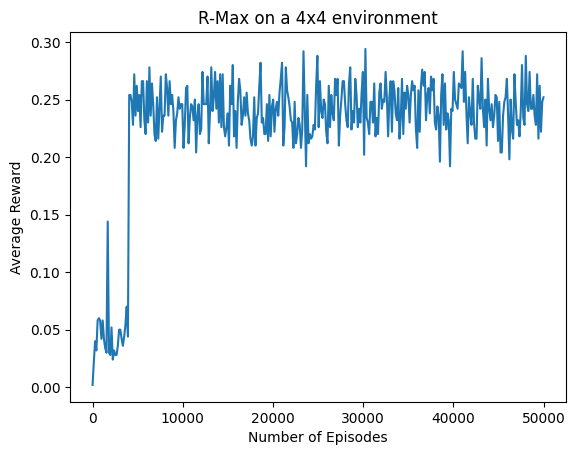

In [64]:
plt.plot(rmaxagent.val2[::7],rmaxagent.val1[::7])
plt.xlabel("Number of Episodes")
plt.ylabel("Average Reward")
plt.title("R-Max on a 4x4 environment")
     